# Import the necessary dependencies 

### Setting TensorFlow 2.x as default version 

In [1]:
try:
    %tensorflow_version 2.x
except Exception:
    pass

import tensorflow as tf

### Importing the Visualisation and Preprocessing packages

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
import cv2

import numpy as np
import pandas as pd
import pickle

import random


### Importing the TensorFlow dependencies

In [3]:
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense,Dropout,Flatten
from tensorflow.keras.layers import BatchNormalization,Conv2D,MaxPooling2D
from tensorflow.keras.utils import to_categorical 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

# Data loading and Visualisation 

### Loading the data

In [4]:
#data = pd.read_csv("german-traffic-signs / signnames.csv") 
  
with open('C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\dataset\\train.p','rb') as f: 
    train_data = pickle.load(f) 
with open('C:\\Users\\Ashika A\\Desktop\TRAIN 5\\dataset\\valid.p', 'rb') as f: 
    val_data = pickle.load(f) 
with open('C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\dataset\\test.p', 'rb') as f: 
    test_data = pickle.load(f) 

# Extracting the labels from the dictionaries 
x_train, y_train = train_data['features'], train_data['labels'] 
x_val, y_val = val_data['features'], val_data['labels'] 
x_test, y_test = test_data['features'], test_data['labels'] 

print(x_train.shape) 
print(x_val.shape) 
print(x_test.shape) 

(34799, 32, 32, 3)
(4410, 32, 32, 3)
(12630, 32, 32, 3)


### Visualising the Image data

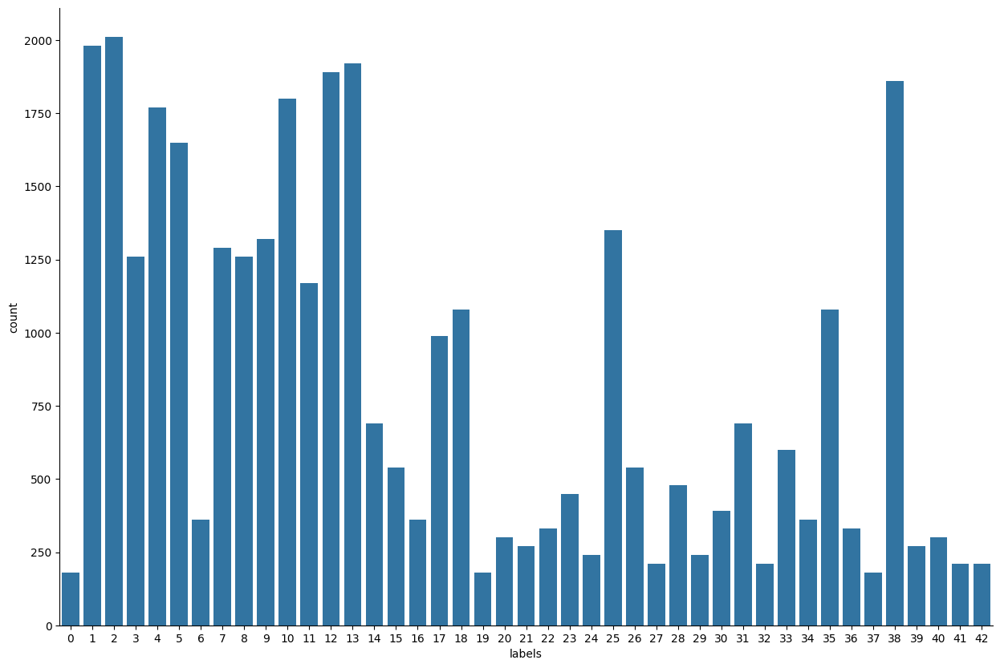

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15,10))
sns.countplot(x="labels", data=train_data)
sns.despine()

# Image Processing & Image Augmentation

### Pre-processing the images using OpenCV

In [6]:
def preprocessing(img): 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    img = cv2.equalizeHist(img) 
    img = img / 255
    return img 
  
x_train_final = np.array(list(map(preprocessing, x_train))) 
x_val_final = np.array(list(map(preprocessing, x_val))) 
x_test_final = np.array(list(map(preprocessing, x_test))) 
  
x_train_final = x_train_final.reshape(34799, 32, 32, 1) 
x_val_final = x_val_final.reshape(4410, 32, 32, 1) 
x_test_final = x_test_final.reshape(12630, 32, 32, 1) 


### Image Augmentation using ImageDataGenerator

In [7]:
import scipy


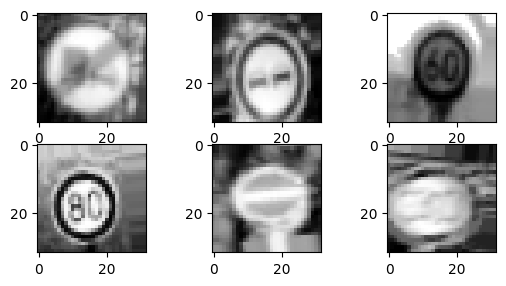

In [8]:

datagen = ImageDataGenerator(width_shift_range = 0.1,  
                  height_shift_range = 0.1,  
                  zoom_range = 0.2,  
                  shear_range = 0.1,  
                  rotation_range = 10) 

datagen.fit(x_train_final) 

#os.makedirs('/content/drive/My Drive/Traffic_sign_Dataset/images')

for x_batch,y_batch in datagen.flow(x_train_final,y_train,batch_size=6,save_to_dir='C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\dataset',save_prefix='img', save_format='jpg'):
    for i in range(0, 6):
        plt.subplot(330 + 1 + i)
        plt.imshow(x_batch[i].reshape(32, 32), cmap=plt.get_cmap('gray'))

    plt.show()
    break

y_train = to_categorical(y_train, 43) 
y_val = to_categorical(y_val, 43) 
y_test = to_categorical(y_test, 43) 


# Model Building and Testing 

### Implementing the CNN Model 

In [9]:
def build_model(hp):
    model = Sequential()

    # Layer 1 
    model.add(Conv2D(filters=hp.Int('CONV_1_FILTER',min_value=32, max_value=64),
                     kernel_size=hp.Choice('KERNEL_1_FILTER', values=[3,5]),
                     activation='relu',
                     input_shape=(32,32,1), 
                     padding='same',
                     kernel_regularizer = l2(0.0005)
                     ))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('DROPOUT_1', min_value=0.0,max_value=0.5,default=0.25,step=0.05)))

    
    # Layer 2 
    model.add(Conv2D(filters=hp.Int('CONV_2_FILTER',min_value=32, max_value=128),
                     kernel_size=hp.Choice('KERNEL_2_FILTER', values=[3,5]),
                     activation='relu',
                     padding='same',
                     kernel_regularizer = l2(0.0005)
                     ))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('DROPOUT_2', min_value=0.0,max_value=0.5,default=0.25,step=0.05)))


    # Layer 3
    model.add(Conv2D(filters=hp.Int('CONV_3_FILTER',min_value=32, max_value=128),
                     kernel_size=hp.Choice('KERNEL_3_FILTER', values=[3,5]),
                     activation='relu',
                     padding='same',
                     kernel_regularizer = l2(0.0005)
                     ))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('DROPOUT_3', min_value=0.0,max_value=0.5,default=0.25,step=0.05)))

    
    model.add(Flatten())

    
    model.add(Dense(hp.Int('DENSE_1_LAYER', 
                           min_value=32, 
                           max_value=512),
                    
                    activation = hp.Choice(
                    'dense_activation',
                    values=['relu', 'tanh', 'sigmoid'],
                    default='relu')
    ))
    model.add(Dropout(hp.Float('DROPOUT_2', min_value=0.0,max_value=0.5,default=0.25,step=0.05)))

    model.add(Dense(43, activation='softmax'))

    # Learning Rate set between 0.0001 to 0.01
    model.compile(Adam(hp.Float(
                    'learning_rate',
                    min_value=1e-4,
                    max_value=1e-2,
                    sampling='LOG')),
                    loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model
    

### Install Kerastuner

In [10]:
! pip install keras-tuner

### Use RandomSearch using keraatuner to find the best hyperparameters

In [11]:
from kerastuner import RandomSearch

Using TensorFlow backend


C:\Users\Ashika A\AppData\Local\Temp\ipykernel_1528\659161079.py:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import RandomSearch


In [12]:
tuner = RandomSearch(build_model, objective='val_accuracy',
                     max_trials = 10, 
                     directory='C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\dataset',
                     project_name="Traffic_Sign_Classifier")

Reloading Tuner from C:\Users\Ashika A\Desktop\TRAIN 5\dataset\Traffic_Sign_Classifier\tuner0.json


In [13]:
tuner.search_space_summary()

Search space summary
Default search space size: 12
CONV_1_FILTER (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 64, 'step': 1, 'sampling': 'linear'}
KERNEL_1_FILTER (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
DROPOUT_1 (Float)
{'default': 0.25, 'conditions': [], 'min_value': 0.0, 'max_value': 0.5, 'step': 0.05, 'sampling': 'linear'}
CONV_2_FILTER (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 1, 'sampling': 'linear'}
KERNEL_2_FILTER (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
DROPOUT_2 (Float)
{'default': 0.25, 'conditions': [], 'min_value': 0.0, 'max_value': 0.5, 'step': 0.05, 'sampling': 'linear'}
CONV_3_FILTER (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 1, 'sampling': 'linear'}
KERNEL_3_FILTER (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
DROPOUT_3 (Float)
{'default': 0.25, 'conditions

In [14]:
tuner.search(x_train_final,y_train,epochs=10, validation_data=(x_val_final,y_val))

Trial 10 Complete [00h 19m 53s]
val_accuracy: 0.9444444179534912

Best val_accuracy So Far: 0.9507936239242554
Total elapsed time: 02h 57m 31s


### Get the best model

In [15]:
final_model = tuner.get_best_models(num_models=1)[0]

In [16]:
final_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 46)        1196      
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 46)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 16, 16, 46)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 67)        27805     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 8, 8, 67)          0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 67)          0

### Creating a Model Checkpoint

In [17]:
filepath="C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\Traffic_Sign_Classifier-with-Streamlit-master\\Model\\Traffic_Sign_Classifier_CNN.hdf5"
checkpoint_conv = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list_conv = [checkpoint_conv]

### Fit the model

In [18]:
BATCH_SIZE = 100
EPOCHS = 40

In [19]:
history = final_model.fit(
                            datagen.flow(x_train_final, y_train, batch_size=BATCH_SIZE), 
                            steps_per_epoch = int(np.ceil(len(x_train_final)/float(BATCH_SIZE))), 
                            epochs = EPOCHS, 
                            validation_data =(x_val_final, y_val),
                            shuffle = True,
                            callbacks=callbacks_list_conv
                          )


Epoch 1/40
348/348 [==============================] - ETA: 0s - loss: 0.7649 - accuracy: 0.8066
Epoch 1: val_accuracy improved from -inf to 0.95147, saving model to C:\Users\Ashika A\Desktop\TRAIN 5\Traffic_Sign_Classifier-with-Streamlit-master\Model\Traffic_Sign_Classifier_CNN.hdf5
348/348 [==============================] - 86s 242ms/step - loss: 0.7649 - accuracy: 0.8066 - val_loss: 0.2747 - val_accuracy: 0.9515
Epoch 2/40


C:\Users\Ashika A\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


348/348 [==============================] - ETA: 0s - loss: 0.5549 - accuracy: 0.8690
Epoch 2: val_accuracy improved from 0.95147 to 0.95986, saving model to C:\Users\Ashika A\Desktop\TRAIN 5\Traffic_Sign_Classifier-with-Streamlit-master\Model\Traffic_Sign_Classifier_CNN.hdf5
348/348 [==============================] - 86s 246ms/step - loss: 0.5549 - accuracy: 0.8690 - val_loss: 0.2516 - val_accuracy: 0.9599
Epoch 3/40
348/348 [==============================] - ETA: 0s - loss: 0.4863 - accuracy: 0.8917
Epoch 3: val_accuracy improved from 0.95986 to 0.97166, saving model to C:\Users\Ashika A\Desktop\TRAIN 5\Traffic_Sign_Classifier-with-Streamlit-master\Model\Traffic_Sign_Classifier_CNN.hdf5
348/348 [==============================] - 84s 241ms/step - loss: 0.4863 - accuracy: 0.8917 - val_loss: 0.2274 - val_accuracy: 0.9717
Epoch 4/40
348/348 [==============================] - ETA: 0s - loss: 0.4352 - accuracy: 0.9085
Epoch 4: val_accuracy did not improve from 0.97166
348/348 [=============

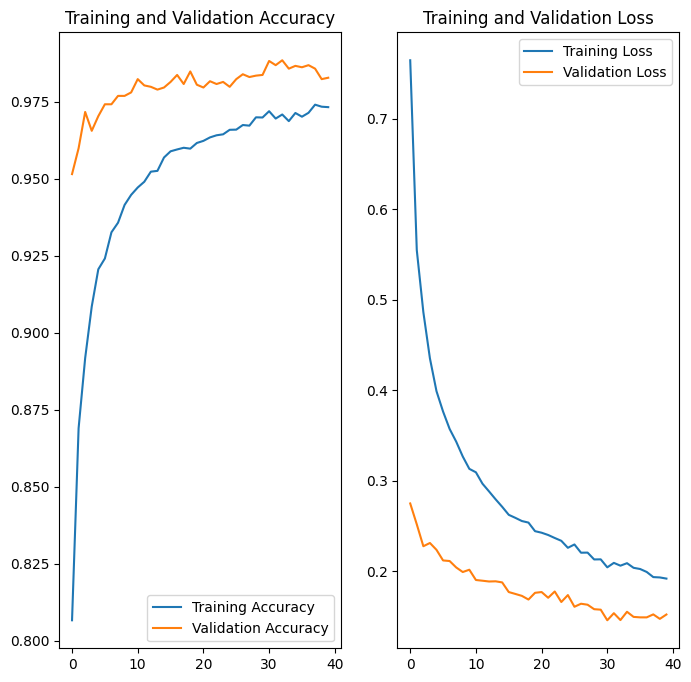

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Load the model's weights and biases for evaluation on Test set

In [21]:
final_model.load_weights("C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\Traffic_Sign_Classifier-with-Streamlit-master\\Model\\Traffic_Sign_Classifier_CNN.hdf5")
final_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [22]:
Pred_conv = final_model.evaluate(x_test_final, y_test, verbose=0)
print("Results on the test data")
print(" ")
print("%s- %.2f" % (final_model.metrics_names[0], Pred_conv[0]))
print("%s- %.2f" % (final_model.metrics_names[1], Pred_conv[1]))

Results on the test data
 
loss- 0.20
accuracy- 0.97


### Testing the model on the test dataset

1/1 [==============================] - 1s 669ms/step
Predicted sign: [[2.55001112e-07 2.53698054e-05 4.96351493e-09 1.90141733e-07
  5.47568491e-10 2.81512075e-05 9.99850512e-01 2.98791250e-08
  8.98499997e-10 5.20582577e-10 1.65335514e-08 2.23297184e-06
  1.58906022e-09 2.54501931e-08 7.92149124e-11 4.91902309e-12
  1.85352678e-06 1.05721520e-08 4.71089112e-10 1.67503367e-09
  4.15370693e-07 9.21042513e-08 3.79714316e-11 3.36692918e-09
  9.62615987e-10 1.18655976e-07 1.01400461e-08 9.08544422e-08
  4.01579356e-08 1.44745760e-09 8.37116090e-07 1.36012645e-07
  2.53336952e-06 1.47021035e-08 1.86412639e-11 1.29224305e-11
  6.15168005e-09 2.86707857e-09 9.26037136e-10 3.19917923e-08
  9.07625179e-07 9.02894158e-07 8.52035082e-05]]
---------------------------------------------------------------------------
1/1 [==============================] - 0s 25ms/step
Predicted Sign[[9.9700779e-01 2.4875656e-03 3.1012564e-07 1.9755544e-07 4.9159946e-05
  1.4082156e-07 1.4374336e-06 4.6294267e-06 4.37

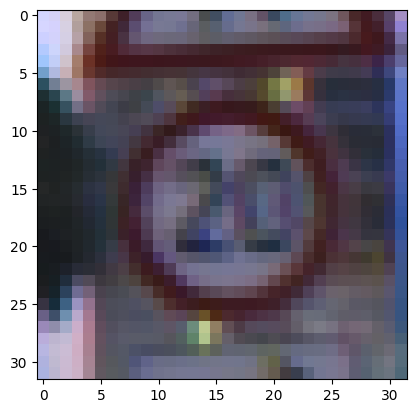

In [23]:

plt.imshow(x_test[990]) 
print("Predicted sign: "+ str( 
        final_model.predict(x_test_final[1700].reshape(1, 32, 32, 1))))

print('---------------------------------------------------------------------------')

print("Predicted Sign" + str(final_model.predict(x_test_final[990].reshape(1, 32, 32, 1))))


### Save the model

In [24]:
final_model.save('C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\Traffic_Sign_Classifier-with-Streamlit-master\\Model\\Traffic_Sign_Classifier_CNN.hdf5')

### Loading the saved model 

In [25]:
loaded_model = tf.keras.models.load_model('C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\Traffic_Sign_Classifier-with-Streamlit-master\\Model\\Traffic_Sign_Classifier_CNN.hdf5')

loaded_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 46)        1196      
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 46)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 16, 16, 46)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 67)        27805     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 8, 8, 67)          0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 67)          0

### Making predictions with the loaded model 

1/1 [==============================] - 0s 93ms/step
Predicted sign: [[1.77916945e-06 3.91294528e-03 4.45068674e-03 8.17651581e-03
  3.66235145e-05 9.61690426e-01 1.31890120e-04 2.13486124e-02
  8.75082605e-06 1.32650746e-06 4.57446113e-05 3.55614930e-06
  1.53379204e-07 2.80600631e-07 8.78709514e-08 2.68637632e-06
  3.65779056e-06 6.82209755e-09 8.01208699e-08 9.96781413e-09
  1.84377507e-06 3.11290933e-06 2.37566827e-10 1.53725367e-07
  1.09364869e-07 2.64836103e-07 4.76704997e-07 2.65613892e-07
  4.30954628e-07 1.61185108e-06 3.85180510e-06 6.05696951e-05
  4.41038566e-07 7.12336316e-07 1.08318062e-07 3.50736400e-07
  7.14294472e-08 6.87103210e-08 1.46905234e-06 7.37373540e-08
  4.63861079e-06 6.32403854e-08 1.03354825e-04]]
---------------------------------------------------------------------------
1/1 [==============================] - 0s 23ms/step
Predicted Sign[[1.77916945e-06 3.91294528e-03 4.45068674e-03 8.17651581e-03
  3.66235145e-05 9.61690426e-01 1.31890120e-04 2.13486124e-

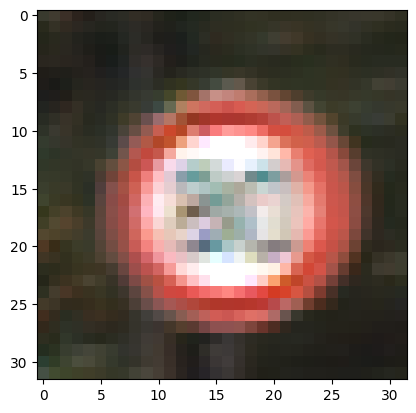

In [26]:
plt.imshow(x_test[1832]) 
print("Predicted sign: "+ str( 
        loaded_model.predict(x_test_final[1832].reshape(1, 32, 32, 1))))

print('---------------------------------------------------------------------------')

print("Predicted Sign" + str(loaded_model.predict(x_test_final[1832].reshape(1, 32, 32, 1))))

### Testing our saved model on random traffic sign images





In [27]:
import cv2
import os
import numpy as np

# Directory containing the images
image_directory = 'C:\\Users\\Ashika A\\Desktop\\TRAIN 5\\Traffic_Sign_Classifier-with-Streamlit-master\\Test Random Images'

# List all files in the directory
image_files = [f for f in os.listdir(image_directory) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Load and process each image
for image_file in image_files:
    # Construct the full path to the image
    image_path = os.path.join(image_directory, image_file)

    # Read the image
    img = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if img is not None:
        # Convert to grayscale
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Normalize and resize the image
        img = img / 255
        img = cv2.resize(img, (32, 32))

        # Reshape for model input
        img = np.reshape(img, [1, 32, 32, 1])

        # Make predictions
        classes = final_model.predict(img)
        print(f"Image: {image_file}, Class: {classes[0]}")
    else:
        print(f"Failed to load the image: {image_file}")


1/1 [==============================] - 0s 27ms/step
Image: 00001.png, Class: [1.1754484e-05 9.9994528e-01 7.2351345e-06 2.1569551e-09 3.3320191e-06
 2.0666537e-06 2.5326832e-05 6.8681814e-08 4.8606439e-09 1.2284276e-11
 9.3515591e-11 3.5842054e-09 2.4876209e-10 1.5432302e-09 5.6136762e-10
 2.6696931e-10 1.7167531e-07 1.2484232e-10 1.0116216e-09 1.0720885e-09
 9.4195304e-11 2.1661997e-08 4.1251607e-12 6.5793794e-11 2.0249573e-10
 9.6202712e-08 1.6792169e-09 7.4444761e-10 2.6626143e-10 2.2360827e-09
 3.6370671e-09 8.4609280e-07 1.5569902e-09 2.4200817e-11 1.8080334e-08
 3.0027275e-10 5.7353139e-10 1.1727856e-07 1.5013331e-08 9.8016120e-09
 3.4323832e-06 2.3208711e-11 7.0525146e-09]
1/1 [==============================] - 0s 26ms/step
Image: 00003.png, Class: [8.2926649e-10 5.7255878e-10 9.4197183e-10 1.9286706e-07 1.4824873e-08
 8.6273220e-09 1.4377713e-06 8.6510994e-09 1.5238442e-09 3.3794973e-07
 2.6140062e-06 2.0213510e-07 1.6399408e-08 2.7603443e-07 4.2630686e-06
 1.0228847e-06 9.7388